# Using CellTypist for cell type classification
This notebook showcases the cell type classification for scRNA-seq query data by retrieving the most likely cell type labels from either the built-in CellTypist models or the user-trained custom models.

ORIGINAL-NOTEBOOK: [link](https://colab.research.google.com/github/Teichlab/celltypist/blob/main/docs/notebook/celltypist_tutorial.ipynb#scrollTo=zaucKA3Wti-w)

Only the main steps and key parameters are introduced in this notebook. Refer to detailed [Usage](https://github.com/Teichlab/celltypist#usage) if you want to learn more.

## Install CellTypist

In [ ]:
!pip install celltypist
!pip install scanpy
!pip install -U matplotlib

In [1]:
import scanpy as sc
import celltypist
from celltypist import models
# from google.colab import drive
# drive.mount('/content/drive')

In [5]:
# ANNDATA_FOLDER = 'drive/MyDrive/CT-Annotation-tools-dataset/'
ANNDATA_FOLDER = 'Datasets'
QUERY_DATASET_NAME = 'TS_Lung'
REFERENCE_DATA_FILE = 'PopV_Reference_Lung'
query_adata = sc.read_h5ad(f'{ANNDATA_FOLDER}/{QUERY_DATASET_NAME}/{QUERY_DATASET_NAME}.h5ad')

In [6]:
from pprint import pprint
pprint(f'var: {query_adata.var.columns.values}')
pprint(f'uns: {query_adata.uns.keys()}')
pprint(f'obs: {query_adata.obs.columns.values}')
pprint(f'obsm: {query_adata.obsm.keys()}')

("var: ['gene_symbol' 'feature_type' 'ensemblid' 'highly_variable' 'means'\n"
 " 'dispersions' 'dispersions_norm' 'mean' 'std']")
("uns: dict_keys(['_scvi', '_training_mode', 'cell_ontology_class_colors', "
 "'dendrogram_cell_type_tissue', "
 "'dendrogram_computational_compartment_assignment', "
 "'dendrogram_consensus_prediction', 'dendrogram_tissue_cell_type', "
 "'donor_colors', 'donor_method_colors', 'hvg', 'method_colors', 'neighbors', "
 "'organ_tissue_colors', 'sex_colors', 'tissue_colors', 'umap'])")
("obs: ['organ_tissue' 'method' 'donor' 'anatomical_information' "
 "'n_counts_UMIs'\n"
 " 'n_genes' 'cell_ontology_class' 'free_annotation' 'manually_annotated'\n"
 " 'compartment' 'gender']")
'obsm: KeysView(AxisArrays with keys: X_pca, X_scvi, X_scvi_umap, X_umap)'


In [7]:
query_adata.var

,gene_symbol,feature_type,ensemblid,highly_variable,means,dispersions,dispersions_norm,mean,std
DDX11L1,DDX11L1,Gene Expression,ENSG00000223972.5,False,6.398244e-05,0.835044,-0.573947,0.000039,0.005574
WASH7P,WASH7P,Gene Expression,ENSG00000227232.5,False,2.274395e-03,2.442280,0.533203,0.001080,0.031731
MIR6859-1,MIR6859-1,Gene Expression,ENSG00000278267.1,False,6.175251e-05,1.295335,-0.256874,0.000033,0.005634
MIR1302-2HG,MIR1302-2HG,Gene Expression,ENSG00000243485.5,False,1.372886e-04,2.656352,0.680668,0.000048,0.008041
MIR1302-2,MIR1302-2,Gene Expression,ENSG00000284332.1,False,1.000000e-12,NaN,0.000000,0.000000,1.000000
...,...,...,...,...,...,...,...,...,...
MT-ND6,MT-ND6,Gene Expression,ENSG00000198695.2,False,9.634841e-01,2.466404,0.154140,0.590065,0.741395
MT-TE,MT-TE,Gene Expression,ENSG00000210194.1,False,1.600667e-01,1.603787,-0.044396,0.083929,0.301820
MT-CYB,MT-CYB,Gene Expression,ENSG00000198727.2,False,4.367693e+00,4.765751,-0.499747,3.874830,1.104192
MT-TT,MT-TT,Gene Expression,ENSG00000210195.2,False,6.573967e-02,0.624316,-0.719108,0.040580,0.186848


In [9]:
# query_adata.obs[['seurat_clusters','cell_type']].drop_duplicates().sort_values(by=['seurat_clusters','cell_type'])
query_adata.obs['cell_ontology_class'].drop_duplicates()

cell_id
AAACCCAAGAACTCCT_TSP14_Lung_Distal_10X_1_1                                 type ii pneumocyte
AAAGGGCAGACATACA_TSP14_Lung_Distal_10X_1_1                                         neutrophil
AAAGGGCGTCGGAAAC_TSP14_Lung_Distal_10X_1_1                     cd4-positive alpha-beta t cell
AACAAGAGTGTATACC_TSP14_Lung_Distal_10X_1_1                     cd8-positive alpha-beta t cell
AAGATAGAGGTAAGGA_TSP14_Lung_Distal_10X_1_1                                            nk cell
AATGAAGAGTGTGTTC_TSP14_Lung_Distal_10X_1_1                  bronchial vessel endothelial cell
AATTCCTAGGTGCTTT_TSP14_Lung_Distal_10X_1_1                                 smooth muscle cell
CAACAGTAGAGGATCC_TSP14_Lung_Distal_10X_1_1                                   adventitial cell
CCGTGAGTCGATTGGT_TSP14_Lung_Distal_10X_1_1                                         macrophage
GTCGCGAGTTAAGGAT_TSP14_Lung_Distal_10X_1_1                            respiratory mucous cell
AAACCCACAACTCGTA_TSP1_lung_2                        

This dataset includes 46,500 cells and 26,329 genes collected from the LungMap study, thereby showing the practical applicability of CellTypist.

In [10]:
query_adata.shape

(35682, 58870)

In [11]:
sc.pp.normalize_total(query_adata, target_sum = 1e4)
sc.pp.log1p(query_adata)

The expression matrix (`adata_2000.X`) is pre-processed (and required) as log1p normalised expression to 10,000 counts per cell (this matrix can be alternatively stashed in `.raw.X`).

In [12]:
query_adata.X.expm1().sum(axis = 1)

matrix([[ 9999.999],
        [10000.   ],
        [ 9999.999],
        ...,
        [10000.   ],
        [10000.   ],
        [10000.   ]], dtype=float32)

## Assign cell type labels using a CellTypist built-in model
In this section, we show the procedure of transferring cell type labels from built-in models to the query dataset.

Download the latest CellTypist models.

In [71]:
# Enabling `force_update = True` will overwrite existing (old) models.
models.download_models(force_update = True)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 17
📂 Storing models in C:\Users\HP\.celltypist\data\models
💾 Downloading model [1/17]: Immune_All_Low.pkl
💾 Downloading model [2/17]: Immune_All_High.pkl
💾 Downloading model [3/17]: Adult_Mouse_Gut.pkl
💾 Downloading model [4/17]: Autopsy_COVID19_Lung.pkl
💾 Downloading model [5/17]: COVID19_Immune_Landscape.pkl
💾 Downloading model [6/17]: Cells_Fetal_Lung.pkl
💾 Downloading model [7/17]: Cells_Intestinal_Tract.pkl
💾 Downloading model [8/17]: Cells_Lung_Airway.pkl
💾 Downloading model [9/17]: Developing_Human_Brain.pkl
💾 Downloading model [10/17]: Developing_Mouse_Brain.pkl
💾 Downloading model [11/17]: Healthy_COVID19_PBMC.pkl
💾 Downloading model [12/17]: Human_IPF_Lung.pkl
💾 Downloading model [13/17]: Human_Lung_Atlas.pkl
💾 Downloading model [14/17]: Human_PF_Lung.pkl
💾 Downloading model [15/17]: Lethal_COVID19_Lung.pkl
💾 Downloading model [16/17]: Nuclei_Lung_Airway.pkl
💾 Do

All models are stored in `models.models_path`.

In [13]:
models.models_path

'C:\\Users\\HP\\.celltypist\\data\\models'

Get an overview of the models and what they represent.

In [14]:
models.models_description()

👉 Detailed model information can be found at `https://www.celltypist.org/models`


,model,description
0,Immune_All_Low.pkl,immune sub-populations combined from 20 tissue...
1,Immune_All_High.pkl,immune populations combined from 20 tissues of...
2,Adult_Mouse_Gut.pkl,cell types in the adult mouse gut combined fro...
3,Autopsy_COVID19_Lung.pkl,cell types from the lungs of 16 SARS-CoV-2 inf...
4,COVID19_Immune_Landscape.pkl,immune subtypes from lung and blood of COVID-1...
5,Cells_Fetal_Lung.pkl,cell types from human embryonic and fetal lungs
6,Cells_Intestinal_Tract.pkl,"intestinal cells from fetal, pediatric (health..."
7,Cells_Lung_Airway.pkl,cell populations from scRNA-seq of five locati...
8,Developing_Human_Brain.pkl,cell types from the first-trimester developing...
9,Developing_Human_Thymus.pkl,"cell populations in embryonic, fetal, pediatri..."


Choose the model you want to employ, for example, the model with all tissues combined containing low-hierarchy (high-resolution) immune cell types/subtypes.

In [15]:
# Indeed, the `model` argument defaults to `Immune_All_Low.pkl`.
model_name = 'Human_Lung_Atlas.pkl'
model = models.Model.load(model = model_name)

Show the model meta information.

In [16]:
model

CellTypist model with 58 cell types and 4874 features
    date: 2022-02-26 01:55:18.658513
    details: integrated Human Lung Cell Atlas (HLCA) combining 46 datasets of the human respiratory system
    source: https://doi.org/10.1101/2022.03.10.483747
    version: v1
    cell types: AT1, AT2, ..., Tuft
    features: TSPAN6, FGR, ..., LL22NC03-N95F10.1

This Human-Lung-Atlas model contains 58 cell states.

In [17]:
model.cell_types.shape, model.cell_types

((58,),
 array(['AT1', 'AT2', 'AT2 proliferating', 'Adventitial fibroblasts',
        'Alveolar Mφ CCL3+', 'Alveolar Mφ MT-positive',
        'Alveolar Mφ proliferating', 'Alveolar fibroblasts',
        'Alveolar macrophages', 'B cells', 'Basal resting', 'CD4 T cells',
        'CD8 T cells', 'Classical monocytes', 'Club (nasal)',
        'Club (non-nasal)', 'DC1', 'DC2', 'Deuterosomal',
        'EC aerocyte capillary', 'EC arterial', 'EC general capillary',
        'EC venous pulmonary', 'EC venous systemic', 'Fibromyocytes',
        'Goblet (bronchial)', 'Goblet (nasal)', 'Goblet (subsegmental)',
        'Interstitial Mφ perivascular', 'Ionocyte',
        'Lymphatic EC differentiating', 'Lymphatic EC mature',
        'Lymphatic EC proliferating', 'Mast cells', 'Mesothelium',
        'Migratory DCs', 'Monocyte-derived Mφ', 'Multiciliated (nasal)',
        'Multiciliated (non-nasal)', 'Myofibroblasts', 'NK cells',
        'Neuroendocrine', 'Non-classical monocytes',
        'Peribronchi

# Standardization of unclean datasets:

Observed issues so far:

1. `AnnData.var` object is not in standard format: `pd.DataFrame` with only indexes

2. `AnnData.obs` object is not in standard format: `pd.DataFrame` with only 1 column of existing pre-annotated cell-labels.

3. `AnnData.X` object contains duplicates: `pd.DataFrame`/`sparse-dataframe` contains duplicate columns of gene-expressions.

4. `AnnData.var` object contains duplicates: `pd.DataFrame` contains duplicate values of genes-expressed.

5. `AnnData.X` object is not normalized: The `CxG` is required to be `log1p` normalised expression to `10,000` counts per cell.

Transfer cell type labels from this model to the query dataset using [celltypist.annotate](https://celltypist.readthedocs.io/en/latest/celltypist.html#module-celltypist.annotate).

First we need to align the `var` object in its expected format.

In [18]:
import pandas as pd

query_adata.var = query_adata.var.rename({'gene_symbol':'feature_name'}, axis=1)
query_adata.var = pd.DataFrame(index=query_adata.var['feature_name'])
query_adata.var

""
feature_name
DDX11L1
WASH7P
MIR6859-1
MIR1302-2HG
MIR1302-2
...
MT-ND6
MT-TE
MT-CYB


Next, we also need to standardize the pre-assigned cell type labels in the data, which will be compared to the predicted labels from CellTypist later.

In [19]:
query_adata.obs = query_adata.obs.rename({'cell_ontology_class':'cell_type'}, axis=1)
query_adata.obs = query_adata.obs[['cell_type']]
query_adata.obs

,cell_type
cell_id,
AAACCCAAGAACTCCT_TSP14_Lung_Distal_10X_1_1,type ii pneumocyte
AAACGAAAGGAGCTGT_TSP14_Lung_Distal_10X_1_1,type ii pneumocyte
AAACGAACACGCGTGT_TSP14_Lung_Distal_10X_1_1,type ii pneumocyte
AAACGAACATGCCGCA_TSP14_Lung_Distal_10X_1_1,type ii pneumocyte
AAAGAACGTTAAGGGC_TSP14_Lung_Distal_10X_1_1,type ii pneumocyte
...,...
TSP2_Lung_proxmedialdistal_SS2_B113373_B134458_Stromal_P1_S361,macrophage
TSP2_Lung_proxmedialdistal_SS2_B113373_B134458_Stromal_P2_S362,plasma cell
TSP2_Lung_proxmedialdistal_SS2_B113373_B134458_Stromal_P6_S366,lung microvascular endothelial cell


# The `TS_Lung.h5ad` has duplicate entries in the CxG matrix AnnData.X object, as well as in the AnnData.var object.

In [20]:
from anndata import AnnData


# Reset index and use this dirty column to filter out the duplicates. Somehow the original dataset was created with duplicates in the INDEX column itself!
print(f'Reset index and use this dirty column to filter out the duplicates. Somehow the original dataset was created with duplicates in the INDEX column itself!')
clean_CxG_matrix = query_adata.to_df().T.reset_index().drop_duplicates(subset=['feature_name'], keep='first').set_index('feature_name').T
print(clean_CxG_matrix.shape)

# Get rid of the dirty duplicated values
query_adata.var.index = pd.Categorical(values=clean_CxG_matrix.columns.values, categories=set(clean_CxG_matrix.columns.values))

# Create a whole new AnnData since Scanpy doesn't allow rewriting a new-shaped CxG matrix into existing X object.
new_query_adata = AnnData(X=clean_CxG_matrix, var=query_adata.var, obs=query_adata.obs, uns=query_adata.uns, obsm=query_adata.obsm, obsp=query_adata.obsp) #, layers=query_adata.layers)
print(f'Created a whole new AnnData object of shape: {new_query_adata.shape}')

# Normalize the CxG matrix for CellTypist constraints
sc.pp.normalize_total(query_adata, target_sum = 1e4)
sc.pp.log1p(query_adata)

# Make the var names unique now. Hopefully it works
new_query_adata.var_names_make_unique()


Reset index and use this dirty column to filter out the duplicates. Somehow the original dataset was created with duplicates in the INDEX column itself!
(35682, 57316)
Created a whole new AnnData object of shape: (35682, 57316)


We also need to check for common features between the input query-dataset, and the expected features that the model was built upon.

We see that there are only 4,510 common gene-expression features between both entities.

In [21]:
import numpy as np
k_x = np.isin(query_adata.var_names, model.classifier.features)
k_x.sum(), query_adata.var.shape, query_adata.var_names

(4653,
 (57316, 0),
 CategoricalIndex(['DDX11L1', 'WASH7P', 'MIR6859-1', 'MIR1302-2HG', 'MIR1302-2',
                   'FAM138A', 'OR4G4P', 'OR4G11P', 'OR4F5', 'AL627309.1',
                   ...
                   'MT-ND4', 'MT-TH', 'MT-TS2', 'MT-TL2', 'MT-ND5', 'MT-ND6',
                   'MT-TE', 'MT-CYB', 'MT-TT', 'MT-TP'],
                  categories=['AC099794.1', 'AC016700.1', 'AC004054.1', 'FTH1P26', 'RPS23P1', 'AC025040.1', 'OR1J1', 'AL139424.2', ...], ordered=False, dtype='category', length=57316))

In [22]:
# Not run; predict cell identities using this loaded model.
#predictions = celltypist.annotate(adata_2000, model = model, majority_voting = True)
# Alternatively, just specify the model name (recommended as this ensures the model is intact every time it is loaded).

predictions = celltypist.annotate(new_query_adata, model = model_name, majority_voting = True)

⚠️ Warning: invalid expression matrix, expect all genes and log1p normalized expression to 10000 counts per cell. The prediction result may not be accurate
🔬 Input data has 35682 cells and 57316 genes
🔗 Matching reference genes in the model
🧬 4653 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 15
🗳️ Majority voting the predictions
✅ Majority voting done!


By default (`majority_voting = False`), CellTypist will infer the identity of each query cell independently. This leads to raw predicted cell type labels, and usually finishes within seconds or minutes depending on the size of the query data. You can also turn on the majority-voting classifier (`majority_voting = True`), which refines cell identities within local subclusters after an over-clustering approach at the cost of increased runtime.

The results include both predicted cell type labels (`predicted_labels`), over-clustering result (`over_clustering`), and predicted labels after majority voting in local subclusters (`majority_voting`). Note in the `predicted_labels`, each query cell gets its inferred label by choosing the most probable cell type among all possible cell types in the given model.

In [23]:
# predictions.decision_matrix.iloc[0].sort_values(ascending=False)
predictions.decision_matrix

,AT1,AT2,AT2 proliferating,Adventitial fibroblasts,Alveolar Mφ CCL3+,Alveolar Mφ MT-positive,Alveolar Mφ proliferating,Alveolar fibroblasts,Alveolar macrophages,B cells,...,SMG duct,SMG mucous,SMG serous (bronchial),SMG serous (nasal),Smooth muscle,Subpleural fibroblasts,Suprabasal,T cells proliferating,Transitional Club-AT2,Tuft
cell_id,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGAACTCCT_TSP14_Lung_Distal_10X_1_1,-23.587249,10.775465,-3.761509,-22.299984,-16.445496,-8.554268,-23.789609,-16.953998,-31.389123,-8.839820,...,-18.138534,-10.839442,-9.619350,-10.074160,-12.052160,-9.268339,-26.719339,-14.808352,-28.593572,-9.130695
AAACGAAAGGAGCTGT_TSP14_Lung_Distal_10X_1_1,-25.454094,3.711017,-8.881195,-37.848341,-30.657320,-15.597629,-18.307362,-4.869166,-29.600899,-14.951559,...,-14.845943,-15.912826,-11.660441,-11.802398,-19.289266,-15.139879,-18.531659,-10.417962,-32.184068,-13.993993
AAACGAACACGCGTGT_TSP14_Lung_Distal_10X_1_1,-20.801859,17.761162,-9.826429,-19.655773,-39.973497,-16.379175,-16.096666,-3.063055,-22.491886,-12.996129,...,-12.788820,-11.005921,-17.377130,-12.444928,-21.974976,-10.604541,-16.513617,-14.170442,-28.791357,-10.138375
AAACGAACATGCCGCA_TSP14_Lung_Distal_10X_1_1,-19.372942,6.026032,-11.150046,-24.153953,-15.167233,-19.667303,-16.661173,-16.004804,-32.690431,-12.573569,...,-18.813531,-10.846472,-11.179189,-12.375572,-16.808871,-11.232395,-16.870212,-12.855929,-10.106171,-15.815119
AAAGAACGTTAAGGGC_TSP14_Lung_Distal_10X_1_1,-13.784426,-9.971295,-7.250007,-19.036122,-16.196181,-19.696331,-19.178862,-13.333831,-25.370733,-10.307117,...,-15.250393,-14.389983,-13.561467,-12.703665,-13.706965,-9.971519,-19.274710,-14.538711,-21.510358,-13.386675
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TSP2_Lung_proxmedialdistal_SS2_B113373_B134458_Stromal_P1_S361,-15.750580,-18.583771,-11.867703,-21.708852,-20.426502,-21.133549,-12.505575,-12.690912,-2.708272,-17.132033,...,-14.963878,-12.789779,-13.758615,-12.617251,-19.488828,-12.612827,-22.343672,-12.305945,-27.981865,-12.317830
TSP2_Lung_proxmedialdistal_SS2_B113373_B134458_Stromal_P2_S362,-17.891630,-36.642981,-15.632961,-29.482622,-38.391647,-17.778623,-18.564361,-10.228413,-20.093342,-15.238062,...,-18.398118,-12.133537,-12.715827,-11.890808,-18.168353,-14.668645,-13.309291,-25.487461,-29.002151,-13.845861
TSP2_Lung_proxmedialdistal_SS2_B113373_B134458_Stromal_P6_S366,-8.882589,-27.970723,-16.990190,-15.020071,-25.246123,-18.796021,-20.809001,-15.248064,-13.896063,-15.824472,...,-15.283900,-13.255163,-11.990662,-11.094998,-8.930123,-11.450820,-4.806547,-14.769069,-18.653799,-10.039864


In [24]:
predictions.predicted_labels

,predicted_labels,over_clustering,majority_voting
cell_id,,,
AAACCCAAGAACTCCT_TSP14_Lung_Distal_10X_1_1,AT2,98,AT2
AAACGAAAGGAGCTGT_TSP14_Lung_Distal_10X_1_1,AT2,105,AT2
AAACGAACACGCGTGT_TSP14_Lung_Distal_10X_1_1,AT2,9,AT2
AAACGAACATGCCGCA_TSP14_Lung_Distal_10X_1_1,AT2,36,AT2
AAAGAACGTTAAGGGC_TSP14_Lung_Distal_10X_1_1,Lymphatic EC differentiating,98,AT2
...,...,...,...
TSP2_Lung_proxmedialdistal_SS2_B113373_B134458_Stromal_P1_S361,Alveolar macrophages,206,Alveolar macrophages
TSP2_Lung_proxmedialdistal_SS2_B113373_B134458_Stromal_P2_S362,Plasma cells,147,Plasma cells
TSP2_Lung_proxmedialdistal_SS2_B113373_B134458_Stromal_P6_S366,CD4 T cells,156,Non-classical monocytes


Transform the prediction result into an `AnnData`.

In [25]:
# Get an `AnnData` with predicted labels embedded into the cell metadata columns.
predictions_adata = predictions.to_adata()

Compared to `adata_2000`, the new `adata` has additional prediction information in `adata.obs` (`predicted_labels`, `over_clustering`, `majority_voting` and `conf_score`). Of note, all these columns can be prefixed with a specific string by setting `prefix` in [to_adata](https://celltypist.readthedocs.io/en/latest/celltypist.html#celltypist.classifier.AnnotationResult.to_adata).

In [26]:
predictions_adata.obs['exp_vs_pred'] = predictions_adata.obs.apply(lambda row: row['cell_type']==row['majority_voting'], axis=1)
predictions_adata.obs['exp_vs_pred'].value_counts()

False    35682
Name: exp_vs_pred, dtype: int64

In [27]:
predictions_adata.obs.to_csv(f'{ANNDATA_FOLDER}/{QUERY_DATASET_NAME}/celltypist_preds.csv', index=False)
predictions_adata.obs

,cell_type,predicted_labels,over_clustering,majority_voting,conf_score,exp_vs_pred
cell_id,,,,,,
AAACCCAAGAACTCCT_TSP14_Lung_Distal_10X_1_1,type ii pneumocyte,AT2,98,AT2,0.999979,False
AAACGAAAGGAGCTGT_TSP14_Lung_Distal_10X_1_1,type ii pneumocyte,AT2,105,AT2,0.976131,False
AAACGAACACGCGTGT_TSP14_Lung_Distal_10X_1_1,type ii pneumocyte,AT2,9,AT2,1.000000,False
AAACGAACATGCCGCA_TSP14_Lung_Distal_10X_1_1,type ii pneumocyte,AT2,36,AT2,0.997591,False
AAAGAACGTTAAGGGC_TSP14_Lung_Distal_10X_1_1,type ii pneumocyte,Lymphatic EC differentiating,98,AT2,0.000959,False
...,...,...,...,...,...,...
TSP2_Lung_proxmedialdistal_SS2_B113373_B134458_Stromal_P1_S361,macrophage,Alveolar macrophages,206,Alveolar macrophages,0.062487,False
TSP2_Lung_proxmedialdistal_SS2_B113373_B134458_Stromal_P2_S362,plasma cell,Plasma cells,147,Plasma cells,1.000000,False
TSP2_Lung_proxmedialdistal_SS2_B113373_B134458_Stromal_P6_S366,lung microvascular endothelial cell,CD4 T cells,156,Non-classical monocytes,0.014788,False


In addition to this meta information added, the neighborhood graph constructed during over-clustering is also stored in the `adata` 
(If a pre-calculated neighborhood graph is already present in the `AnnData`, this graph construction step will be skipped).  
This graph can be used to derive the cell embeddings, such as the UMAP coordinates.

In [28]:
# If the UMAP or any cell embeddings are already available in the `AnnData`, skip this command.
sc.tl.umap(predictions_adata)

Visualise the prediction results.

In [28]:
predictions_adata.obs['cell_type'].str.len().max(), predictions_adata.obs['predicted_labels'].str.len().max(), predictions_adata.obs['majority_voting'].str.len().max()

(24, 28, 28)

In [29]:
import matplotlib.pyplot as plt

with plt.rc_context({'figure.figsize': (20, 20), 'figure.dpi': (300)}):
  sc.pl.umap(predictions_adata, color=['cell_type', 'predicted_labels', 'majority_voting'], legend_loc='on data', legend_fontsize='20')

Actually, you may not need to explicitly convert `predictions` output by `celltypist.annotate` into an `AnnData` as above. A more useful way is to use the visualisation function [celltypist.dotplot](https://celltypist.readthedocs.io/en/latest/celltypist.html#module-celltypist.plot), which quantitatively compares the CellTypist prediction result (e.g. `majority_voting` here) with the cell types pre-defined in the `AnnData` (here `cell_type`). You can also change the value of `use_as_prediction` to `predicted_labels` to compare the raw prediction result with the pre-defined cell types.

In [29]:
predictions_adata.write(filename=f'{ANNDATA_FOLDER}/{QUERY_DATASET_NAME}/{QUERY_DATASET_NAME}_predictions_anndata.h5ad')
predictions.adata.obs

,cell_type,predicted_labels,over_clustering,majority_voting,conf_score,exp_vs_pred
cell_id,,,,,,
AAACCCAAGAACTCCT_TSP14_Lung_Distal_10X_1_1,type ii pneumocyte,AT2,98,AT2,0.999979,False
AAACGAAAGGAGCTGT_TSP14_Lung_Distal_10X_1_1,type ii pneumocyte,AT2,105,AT2,0.976131,False
AAACGAACACGCGTGT_TSP14_Lung_Distal_10X_1_1,type ii pneumocyte,AT2,9,AT2,1.000000,False
AAACGAACATGCCGCA_TSP14_Lung_Distal_10X_1_1,type ii pneumocyte,AT2,36,AT2,0.997591,False
AAAGAACGTTAAGGGC_TSP14_Lung_Distal_10X_1_1,type ii pneumocyte,Lymphatic EC differentiating,98,AT2,0.000959,False
...,...,...,...,...,...,...
TSP2_Lung_proxmedialdistal_SS2_B113373_B134458_Stromal_P1_S361,macrophage,Alveolar macrophages,206,Alveolar macrophages,0.062487,False
TSP2_Lung_proxmedialdistal_SS2_B113373_B134458_Stromal_P2_S362,plasma cell,Plasma cells,147,Plasma cells,1.000000,False
TSP2_Lung_proxmedialdistal_SS2_B113373_B134458_Stromal_P6_S366,lung microvascular endothelial cell,CD4 T cells,156,Non-classical monocytes,0.014788,False


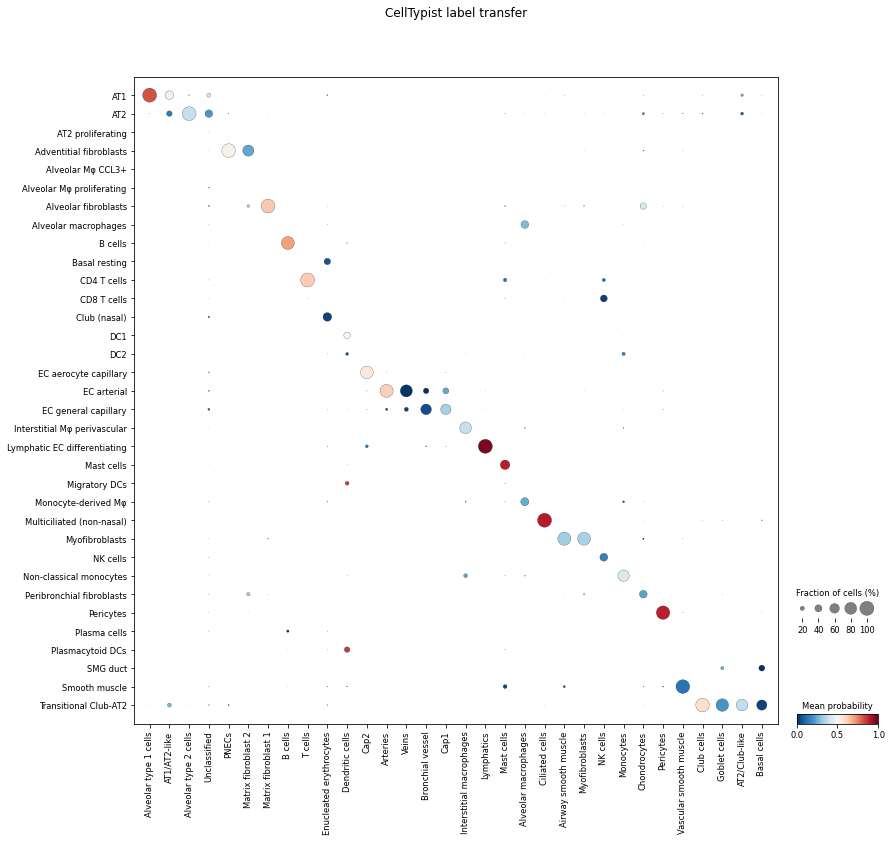

In [31]:
celltypist.dotplot(predictions, use_as_reference = 'cell_type', use_as_prediction = 'majority_voting')

For each pre-defined cell type (each column from the dot plot), this plot shows how it can be 'decomposed' into different cell types predicted by CellTypist (rows).

In [32]:
predictions.predicted_labels.to_csv('CellTypist_annotations.csv', index=False)

# `NSForest` on top of `CellTypist.majorityVote` predictions

Testing to see if NSForest can identify top genes per cell-type-cluster derived from CellTypist predictions.

First clone the repo.

In [33]:
!git clone https://github.com/JCVenterInstitute/NSForest.git

Cloning into 'NSForest'...
remote: Enumerating objects: 90, done.
remote: Counting objects: 100% (33/33), done.
remote: Compressing objects: 100% (31/31), done.
remote: Total 90 (delta 19), reused 6 (delta 2), pack-reused 57
Unpacking objects: 100% (90/90), done.


## Instructions to use NS-Forest v3.0 (more docs on [repo](https://github.com/JCVenterInstitute/NSForest)):

```python
from NSForest_v3 import *
import itertools

adata_markers = NS_Forest(adata) #Runs NS_Forest on scanpy object
Markers = list(itertools.chain.from_iterable(adata_markers['NSForest_Markers'])) #gets list of minimal markers from dataframe for display in scanpy plotting functions
Binary_Markers = list(itertools.chain.from_iterable(adata_markers['Binary_Genes'])) #gets list of binary markers from dataframe for display in scanpy plotting functions
```

NS-Forest v3.0 parameters
```python
NS_Forest(adata, clusterLabelcolumnHeader = "louvain", rfTrees = 1000, Median_Expression_Level = 0, Genes_to_testing = 6, betaValue = 0.5)

adata = scanpy object
rfTrees = Number of trees
clusterLabelcolumnHeader = column header in adata.obs['header_here!'] where cluster assignments reside. Typically 'louvain' if louvain clustering was used.
Median_Expression_Level = median expression level for removing negative markers
Genes_to_testing = How many ranked genes by binary score will be evaluated in permutations by fbeta-score
betaValue = Set values for fbeta weighting. 1 is default f-measure. close to zero is Precision, greater than 1 weights toward Recall
```

> Facing issue with converting the subset anndata into a dataframe in the source-code of the main NS_Forest() function itself:

```python
for clust in ClusterList: #adata.obs.Clusters.cat.categories:    
    subset_adata = adata[adata.obs[clusterLabelcolumnHeader].isin([clust]),:]
    Subset_dataframe = pd.DataFrame(data = subset_adata.X, index = subset_adata.obs, columns = subset_adata.var_names)
    medianValues.loc[clust] = Subset_dataframe.median()
```

Gonna try and use `pd.DataFrame.sparse.from_spmatrix()` to correctly parse the subset anndata. Ask Renee and raise pull-request accordingly.

# NS_FOREST SOURCE CODE

# Spent a lot of time trying to debug the old NSForest-code:
```python
def NS_Forest(adata, clusterLabelcolumnHeader = "louvain", rfTrees = 1000, Median_Expression_Level = 0, Genes_to_testing = 6, betaValue = 0.5):
    #adata = scanpy object
    #rfTrees = Number of trees
    #Median_Expression_Level = median expression level for removing negative markers
    #Genes_to_testing = How many top genes ranked by binary score will be evaluated in permutations by fbeta-score (as the number increases the number of permutation rises exponentially!)
    #betaValue = Set values for fbeta weighting. 1 is default f-measure. close to zero is Precision, greater than 1 weights toward Recall

    #libraries
    import numpy as np
    import pandas as pd
    import numexpr
    import itertools
    from subprocess import call
    import scanpy as sc
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.tree import DecisionTreeClassifier
    from sklearn import tree
    from sklearn.metrics import fbeta_score
    from sklearn.metrics import accuracy_score
    from sklearn.metrics import confusion_matrix
    import graphviz
    import time
    
    # Functions
    def randomForest(adata,dataDummy,column,rfTrees,threads): #Runs Random forest on the binary dummy variables; outputs all genes ranked Gini Index
        x_train = adata.X
        names = adata.var_names
        y_train = dataDummy[column]
        rf = RandomForestClassifier(n_estimators=rfTrees, n_jobs=threads, random_state=123456)
        rf.fit(x_train, y_train)
        Ranked_Features = sorted(zip([round(x, 8) for x in rf.feature_importances_], names),reverse=True)
        return Ranked_Features    
        
    def rankInformative(Ranked_Features,column,rankedDict,howManyInformativeGenes2test): #subsets list according to howManyInformativeGenes2test parameter
        RankedList = []
        midcounter = 0
        for x in Ranked_Features:
            midcounter +=1
            RankedList.append(x[1])
            if midcounter==howManyInformativeGenes2test:
                break
        rankedDict[column] = RankedList
        return RankedList             

    def negativeOut(x, column,medianValues,Median_Expression_Level): # Removes genes with median expression < Median_Expression_Level parameter
        Positive_RankedList_Complete = []
        for i in x:
            if medianValues.loc[column, i] > Median_Expression_Level:
                print(i)
                print(medianValues.loc[column, i])
                Positive_RankedList_Complete.append(i)
            else:
                print(i)
                print(medianValues.loc[column, i])
                print("Is Right Out!")
        return Positive_RankedList_Complete

    def binaryScore(Positive_RankedList_Complete, InformativeGenes, medianValues, column, clusters2Loop, Ranked_Features, Genes_to_testing, Binary_store_DF):
        # Takes top ranked positive genes (number according to Genes_to_testing) and computes Binary score for each gene
        Positive_RankedList = list(Positive_RankedList_Complete[0:InformativeGenes])
        Median_RF_Subset = medianValues.loc[:, Positive_RankedList]
        Rescaled_Matrix = pd.DataFrame()


        for i in Positive_RankedList:
            Target_value = medianValues.loc[column, i]
            Rescaled_values = Median_RF_Subset[[i]].divide(Target_value)
            Rescaled_Matrix = pd.concat([Rescaled_Matrix,Rescaled_values],axis=1)

        difference_matrix = Rescaled_Matrix.apply(lambda x: 1-x, axis=1)
        difference_matrix_clean1 = difference_matrix.where(difference_matrix >= 0, other=0)
        difference_matrix_clean = difference_matrix_clean1.where(difference_matrix > 0, 0)
        ColumnSums = difference_matrix_clean.sum(0)
        rescaled = ColumnSums/clusters2Loop
       
        # Double sort so that for ties, the RF ranking prevails!
        Ranked_Features_df = pd.DataFrame(Ranked_Features)
        Ranked_Features_df.rename(columns={1: 'Symbol'}, inplace=True)
        Ranked_Features_df_indexed = Ranked_Features_df.set_index("Symbol")
        rescaled_df = pd.DataFrame(rescaled)
        binaryAndinformation_Ranks = rescaled_df.join(Ranked_Features_df_indexed,lsuffix='_scaled', rsuffix='_informationGain')
        binaryAndinformation_Ranks.sort_values(by=['0_scaled','0_informationGain'],ascending= [False, False], inplace = True)

        Binary_ranked_Genes = binaryAndinformation_Ranks.index.tolist()
        Binary_RankedList = list(Binary_ranked_Genes[0:Genes_to_testing])
        Binary_scores = rescaled.to_dict()

        Binary_store_DF = Binary_store_DF.append(binaryAndinformation_Ranks)
        
        return Binary_RankedList,Binary_store_DF



    def DT_cutOffs(x, column, dataDummy): # For each gene in the top binary gene, function finds optimal decision tree cutoff for F-beta testing
        cut_dict = {}
        for i in x:
            filename = str(i)
            y_train = dataDummy[column]
            x_train = adata[:,i].X
            
            # VIKRANT-CHANGES:  Following line fails because input anndata has sparse-matrix with 0'th index columns
            #                   However, next line's 'X' object not used anywhere afterwards. Unnecessary fix.
            # X = x_train[:, None]
            # X = x_train[:, 0] if isinstance(x_train, anndata._core.views.SparseCSRView) else x_train[:, None]

            clf = tree.DecisionTreeClassifier(max_leaf_nodes=2)
            clf = clf.fit(x_train, y_train) 
            threshold = clf.tree_.threshold
            cut_dict[i] = threshold[0]
        return cut_dict



    def queryGenerator(Binary_RankedList, cut_dict): # Builds dict to create queries for F-beta testing
        queryList = []
        for i in Binary_RankedList:
            str1 = i
            current_value = cut_dict.get(str1)
            queryString1 = str(str1.replace("-", "_").replace(".", "_"))+'>='+ str(current_value)
            queryList.append(queryString1)
        return queryList

    def permutor(x): # creates all combinations of queries built above
        binarylist2 = x
        combs = []
        for i in range(1, len(x)+1):
            els = [list(x) for x in itertools.combinations(binarylist2, i)]
            combs.extend(els)
        return combs

    def fbetaTest(x, column, adata, Binary_RankedList, testArray, betaValue): # uses queries to perform F-beta testing at the betaValue set in parameters
        fbeta_dict = {}
        subset_adata = adata[:,Binary_RankedList]
        print(f'subset_adata={subset_adata}')
        
        # VIKRANT-CHANGES:  Adding in extra try-catch blocks.
        #                   Subset dataframe should be created from sparse matrix.
        # Subset_dataframe = pd.DataFrame(data = subset_adata.X, index = subset_adata.obs_names, columns = subset_adata.var_names)
        try:
          Subset_dataframe = pd.DataFrame(data = subset_adata.X, index = subset_adata.obs_names, columns = subset_adata.var_names)
        except Exception as e:
          print(f'Failed HERE! {e}')

        # VIKRANT-CHANGES:  Adding in extra try-catch blocks with sparse-matrix processing. Succeeds now.
        #                   Subset dataframe should be created from sparse matrix.
        try:
          Subset_dataframe = pd.DataFrame.sparse.from_spmatrix(
            data=subset_adata.X, 
            index=subset_adata.obs[clusterLabelcolumnHeader],
            columns=subset_adata.var_names
          )
        except Exception as e:
          print(f'AGAIN FAILED HERE {e}')

        Subset_dataframe.columns = Subset_dataframe.columns.str.replace("-", "_").str.replace(".", "_")
        print(f'Subset_dataframe.columns = {Subset_dataframe.columns}')

        for list in x:
            testArray['y_pred'] = 0
            betaQuery = '&'.join(list)            
            Ineq1 = Subset_dataframe.query(betaQuery)
            # print(f'Ineq1 = {Ineq1}')
            
            # VIKRANT-CHANGES:  Commenting out the following line to reset_index() and then use that index_list
            #                   No fix found yet.
            # testList = Ineq1.index.tolist()
            print(f'len(Ineq1.index.tolist())={len(Ineq1.index.tolist())} , Ineq1.index.tolist()={Ineq1.index.tolist()}')
            testList = Ineq1.reset_index().index.tolist()
            print(f'len(testList)={len(testList)}, testList={testList}')

            print(f'testList={testList}')
            print(f'testArray={testArray}')
            testArray.loc[testList, 'y_pred'] = 1
            f1 = fbeta_score(testArray['y_true'], testArray['y_pred'], average= 'binary', beta=betaValue)
            print(f'f1 = {f1}')
            tn, fp, fn, tp = confusion_matrix(testArray['y_true'], testArray['y_pred']).ravel()
            ### strip betaQuery and normalize        
            dictName = column+"&"+betaQuery.replace("_", "-")
            print(f'dictName={dictName}')
            fbeta_dict[dictName] = f1, tn, fp, fn, tp
            print(f'fbeta_dict[dictName]={fbeta_dict[dictName]}')
        print(fbeta_dict)

        return fbeta_dict
    
    def ReportReturn(max_grouped_df):  # Cleaning up results to return as dataframe
        for column in max_grouped_df.columns[8:14]:
            max_grouped_df[column] = max_grouped_df[column].str.replace('nan', '')
        max_grouped_df["NSForest_Markers"] = max_grouped_df[max_grouped_df.columns[8:14]].values.tolist()
        max_grouped_df = max_grouped_df[['clusterName',"f-measure",'markerCount','NSForest_Markers','True Positive','True Negative','False Positive','False Negative',1,2,3,4,5,6,"index"]]
        
        for i in max_grouped_df.index:
            cleanList = [string for string in max_grouped_df.loc[i,'NSForest_Markers'] if string != ""]
            max_grouped_df.at[i, 'NSForest_Markers'] = cleanList
        Results = max_grouped_df
        return Results
  
  
    #Parameters of interest
    
    #Random Forest parameters
    threads = -1   #Number of threads to use, -1 is the greedy option where it will take all available CPUs/RAM

    #Filtering and ranking of genes from random forest parameters
    howManyInformativeGenes2test = 15 #How many genes from the GiniRanking move on for further testing...
    
    #How many top genes from the Random Forest ranked features will be evaluated for binariness 
    InformativeGenes = 10 
    
    #Main function# 
    
    #Creates dummy columns for one vs all Random Forest modeling
    dataDummy = pd.get_dummies(adata.obs[clusterLabelcolumnHeader], columns=[clusterLabelcolumnHeader], prefix = "", prefix_sep = "")
    
    #Creates matrix of cluster median expression values
    medianValues = pd.DataFrame(columns=adata.var_names, index=adata.obs[clusterLabelcolumnHeader].cat.categories)                                                                                                 
    
    ClusterList = adata.obs[clusterLabelcolumnHeader].unique()

    # VIKRANT-CHANGES:  Commenting out the following lines since I've tested my working solution
    #                   Subset dataframe input is a sparse scipy-matrix but code can handle only dataframe
    # for clust in ClusterList: #adata.obs.Clusters.cat.categories:    
    #     subset_adata = adata[adata.obs[clusterLabelcolumnHeader].isin([clust]),:]
    #     Subset_dataframe = pd.DataFrame(data = subset_adata.X, index = subset_adata.obs, columns = subset_adata.var_names)
    #     medianValues.loc[clust] = Subset_dataframe.median()
    for clust in ClusterList:
      subset_adata = adata[adata.obs[clusterLabelcolumnHeader].isin([clust]),:]
      Subset_dataframe = pd.DataFrame.sparse.from_spmatrix(
          data=subset_adata.X, 
          index=subset_adata.obs[clusterLabelcolumnHeader],
          columns=subset_adata.var_names
      )
      medianValues.loc[clust,:] = np.median(Subset_dataframe.to_numpy(), axis=0)
    
    medianValues.to_csv('NSForest3_medianValues.csv')

    ##Use Mean
    #for clust in adata.obs.Clusters.cat.categories:
        #medianValues.loc[clust] = adata[adata.obs[clusterLabelcolumnHeader].isin([clust]),:].X.mean(0)
    
    clusters2Loop = len(dataDummy.columns)-1 
    print(clusters2Loop)
    #gives us the top ten features from RF
    rankedDict = {}
    f1_store_1D = {}
    Binary_score_store_DF = pd.DataFrame()
    DT_cutoffs_store = {}
    
    for column in dataDummy.columns:
        print(column)
        Binary_store_DF = pd.DataFrame()
        
        #Run Random Forest and get a ranked list
        Ranked_Features = randomForest(adata, dataDummy, column, rfTrees, threads)
        RankedList = rankInformative(Ranked_Features,column,rankedDict,howManyInformativeGenes2test)
        
        #Setup testArray for f-beta evaluation
        testArray = dataDummy[[column]]
        testArray.columns = ['y_true']
        
        #Rerank according to expression level and binary score
        Positive_RankedList_Complete = negativeOut(RankedList, column, medianValues, Median_Expression_Level)
        
        outputlist = binaryScore(Positive_RankedList_Complete, InformativeGenes, medianValues, column, clusters2Loop, Ranked_Features, Genes_to_testing, Binary_store_DF)
        Binary_RankedList = outputlist[0]
        Binary_score_store_DF_extra = outputlist[1].assign(clusterName = column)         
        Binary_score_store_DF = Binary_score_store_DF.append(Binary_score_store_DF_extra)
        
        # VIKRANT CHANGES:  Code had unnecessary error in this function.
        #Get expression cutoffs for f-beta testing
        cut_dict = DT_cutOffs(Binary_RankedList, column, dataDummy)
        DT_cutoffs_store[column] = cut_dict
        
        #Generate expression queries and run those queries using fscore() function
        queryInequalities = queryGenerator(Binary_RankedList, cut_dict)
        print(f'queryInequalities={queryInequalities}')
        FullpermutationList = permutor(queryInequalities)
        print(f'FullpermutationList = {FullpermutationList}')
        f1_store = fbetaTest(FullpermutationList, column, adata, Binary_RankedList, testArray, betaValue)
        print(f'f1_store = {f1_store}')
        f1_store_1D.update(f1_store)
        print(f'f1_store = {f1_store}')
        
        
    #Report generation and cleanup for file writeouts 
    f1_store_1D_df = pd.DataFrame() #F1 store gives all results.
    f1_store_1D_df = pd.DataFrame.from_dict(f1_store_1D)
    print(f'f1_store_1D_df = {f1_store_1D_df}')
    Results_df = f1_store_1D_df.transpose()
    Results_df.columns = ["f-measure", "True Negative", "False Positive", "False Negative", "True Positive"]
    Results_df['markerCount'] = Results_df.index.str.count('&')
    Results_df.reset_index(level=Results_df.index.names, inplace=True)
    Results_df_done= Results_df['index'].apply(lambda x: pd.Series(x.split('&')))
    NSForest_Results_Table=Results_df.join(Results_df_done)
    NSForest_Results_Table_Fin = pd.DataFrame()
    NSForest_Results_Table_Fin = NSForest_Results_Table[NSForest_Results_Table.columns[0:8]]
    
    for i, col in enumerate(NSForest_Results_Table.columns[8:15]):
        splitResults = NSForest_Results_Table[col].astype(str).apply(lambda x: pd.Series(x.split('>='))) 
        firstOnly = splitResults[0]
        Ascolumn = firstOnly.to_frame()
        Ascolumn.columns = [col]
        NSForest_Results_Table_Fin = NSForest_Results_Table_Fin.join(Ascolumn)
    
    NSForest_Results_Table_Fin.rename(columns={0:'clusterName'},inplace=True) #rename columns by position
    NSForest_Results_Table_Fin.sort_values(by=['clusterName','f-measure','markerCount'],ascending= [True, False, True], inplace = True)
    print(NSForest_Results_Table_Fin)
    time.perf_counter()
    
    #Write outs
    Binary_score_store_DF.to_csv('NS-Forest_v3_Extended_Binary_Markers_Supplmental.csv')
    NSForest_Results_Table_Fin.to_csv('NS-Forest_v3_Full_Results.csv')
    
    #Subset of full results 
    max_grouped = NSForest_Results_Table_Fin[NSForest_Results_Table_Fin.groupby("clusterName")["f-measure"].transform('max') == NSForest_Results_Table_Fin['f-measure']]
    max_grouped_df = pd.DataFrame(max_grouped)
    
    ##Move binary genes to Results dataframe
    clusters2Genes = pd.DataFrame(columns = ['Gene', 'clusterName'])
    clusters2Genes["clusterName"] = Binary_score_store_DF["clusterName"]
    clusters2Genes["Gene"] = Binary_score_store_DF.index
    GroupedBinarylist = clusters2Genes.groupby('clusterName').apply(lambda x: x['Gene'].unique()) 
    BinaryFinal = pd.DataFrame(columns = ['clusterName','Binary_Genes'])
    BinaryFinal['clusterName'] = GroupedBinarylist.index
    BinaryFinal['Binary_Genes'] = GroupedBinarylist.values
        
    Results = ReportReturn(max_grouped_df)
    #Results["NSForest_Markers"] = Results["NSForest_Markers"].apply(clean_alt_list)
    
    Result = pd.merge(Results, BinaryFinal, on='clusterName')
    Result.to_csv('NSForest_v3_Final_Result.csv')
    ResultUnique = Result.drop_duplicates(subset=["clusterName"]) 
    
    time.perf_counter()
    
    return ResultUnique


# from NSForest.NSForest_v3 import *
import itertools

adata_markers = NS_Forest(predictions_adata, clusterLabelcolumnHeader='majority_voting') # Runs NS_Forest on scanpy object (containing CellTypist.majorityVote predictions)
markers = list(itertools.chain.from_iterable(adata_markers['NSForest_Markers'])) # gets list of minimal markers from dataframe for display in scanpy plotting functions
binary_markers = list(itertools.chain.from_iterable(adata_markers['Binary_Genes'])) # gets list of binary markers from dataframe for display in scanpy plotting functions
```

# END OF SOURCE CODE

In [2]:
import scanpy as sc
ANNDATA_FOLDER = 'Datasets'
# PREDS_ADATA_FILE = 'LungMap_predictions_anndata.h5ad'
PREDS_ADATA_FILE = f'TS_Lung/TS_Lung.h5ad'
predictions_adata = sc.read_h5ad(f'{ANNDATA_FOLDER}/{PREDS_ADATA_FILE}')
predictions_adata

AnnData object with n_obs × n_vars = 35682 × 58870
    obs: 'organ_tissue', 'method', 'donor', 'anatomical_information', 'n_counts_UMIs', 'n_genes', 'cell_ontology_class', 'free_annotation', 'manually_annotated', 'compartment', 'gender'
    var: 'gene_symbol', 'feature_type', 'ensemblid', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: '_scvi', '_training_mode', 'cell_ontology_class_colors', 'dendrogram_cell_type_tissue', 'dendrogram_computational_compartment_assignment', 'dendrogram_consensus_prediction', 'dendrogram_tissue_cell_type', 'donor_colors', 'donor_method_colors', 'hvg', 'method_colors', 'neighbors', 'organ_tissue_colors', 'sex_colors', 'tissue_colors', 'umap'
    obsm: 'X_pca', 'X_scvi', 'X_scvi_umap', 'X_umap'
    layers: 'decontXcounts', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [2]:
import pandas as pd

celltypist_lung_preds = pd.read_csv('CellTypist_annotations_from_LungMap.csv')
azimuth_lung_preds = pd.read_csv('azimuth_pred.tsv', sep='\t')

CELLTYPIST_PREDICTION_COLUMN = 'majority_voting'
AZIMUTH_PREDICTION_COLUMN = 'predicted.ann_'
AZIMUTH_COLUMN = f'{AZIMUTH_PREDICTION_COLUMN}finest_level'


comprehensive_comparison_df = pd.DataFrame()
comprehensive_comparison_df['celltypist.majority_vote_preds'] = celltypist_lung_preds[CELLTYPIST_PREDICTION_COLUMN]
comprehensive_comparison_df['celltypist.majority_vote_preds_scores'] = celltypist_lung_preds['conf_score']
comprehensive_comparison_df['azimuth.finest_level_preds'] = azimuth_lung_preds[AZIMUTH_COLUMN]
comprehensive_comparison_df['azimuth.finest_level_preds_scores'] = azimuth_lung_preds[f'{AZIMUTH_COLUMN}.score']
comprehensive_comparison_df['predictions_agree'] = comprehensive_comparison_df['celltypist.majority_vote_preds'] == comprehensive_comparison_df['azimuth.finest_level_preds']
comprehensive_comparison_df



# Wrangle the predictions.obs dataframe to incorporate Azimuth predictions and scores
predictions_adata.obs['azimuth.finest_level_preds'] =  comprehensive_comparison_df.loc[:, 'azimuth.finest_level_preds'].values
predictions_adata.obs['azimuth.finest_level_preds_scores'] = comprehensive_comparison_df[f'azimuth.finest_level_preds_scores'].values
predictions_adata.obs['celltypist_vs_azimuth'] = predictions_adata.obs['majority_voting'] == predictions_adata.obs['azimuth.finest_level_preds']

# Flip the conf-Score column
predictions_adata.obs['celltypist.majority_voting_scores'] = predictions_adata.obs['conf_score']
predictions_adata.obs['conf_score'] = predictions_adata.obs['azimuth.finest_level_preds_scores']
predictions_adata.obs

,cell_type,predicted_labels,over_clustering,majority_voting,conf_score,exp_vs_pred,azimuth.finest_level_preds,azimuth.finest_level_preds_scores,celltypist_vs_azimuth,celltypist.majority_voting_scores
0,Alveolar macrophages,Non-classical monocytes,115,Interstitial Mφ perivascular,0.311784,False,Interstitial Mφ perivascular,0.311784,True,0.014423
1,Alveolar macrophages,Non-classical monocytes,218,Monocyte-derived Mφ,0.390653,False,Classical monocytes,0.390653,False,0.467719
2,Alveolar macrophages,Transitional Club-AT2,148,Alveolar macrophages,0.341172,True,CD4 T cells,0.341172,False,0.983311
3,Alveolar macrophages,Transitional Club-AT2,218,Monocyte-derived Mφ,0.338468,False,EC general capillary,0.338468,False,0.999753
4,Monocytes,DC2,165,Non-classical monocytes,0.292911,False,Classical monocytes,0.292911,False,0.268376
...,...,...,...,...,...,...,...,...,...,...
46495,PNECs,Neuroendocrine,208,Adventitial fibroblasts,0.577514,False,Ionocyte,0.577514,False,0.988684
46496,PNECs,Club (non-nasal),208,Adventitial fibroblasts,0.794742,False,Ionocyte,0.794742,False,0.999974
46497,PNECs,EC venous systemic,208,Adventitial fibroblasts,0.824802,False,Ionocyte,0.824802,False,0.999967
46498,PNECs,Monocyte-derived Mφ,143,AT2,0.641562,False,AT1,0.641562,False,0.991524


In [3]:
from NSForest.NSForest_v3dot9_1 import NSForest

clusterLabelcolumnHeader = 'majority_voting'
NSForest_results_selected = NSForest(
    adata = predictions_adata, 
    cluster_header = clusterLabelcolumnHeader,
    # n_trees = 10,
    n_genes_eval = 10,
    cluster_list = ["AT2"]
  )

Preparing data...
--- 0.8863887786865234 seconds ---
Calculating medians...
--- 102.98121809959412 seconds ---
Number of clusters to evaluate: 1
1 out of 1:
	AT2
df_pred=       ZNF385B  MFSD2A  ABCA3  SLC34A2  TMEM163  LAMP3  LRRK2  SNX25  ACOXL  \
0            0       0      0        0        1      0      0      0      0   
1            0       0      0        0        0      0      0      0      0   
2            0       0      0        0        0      0      0      0      0   
3            0       0      0        0        0      0      0      0      0   
4            0       0      0        0        1      0      0      0      0   
...        ...     ...    ...      ...      ...    ...    ...    ...    ...   
46495        0       0      0        0        0      0      0      0      0   
46496        0       0      0        0        0      0      0      0      1   
46497        0       0      1        0        0      0      0      0      0   
46498        0       0      0        1  

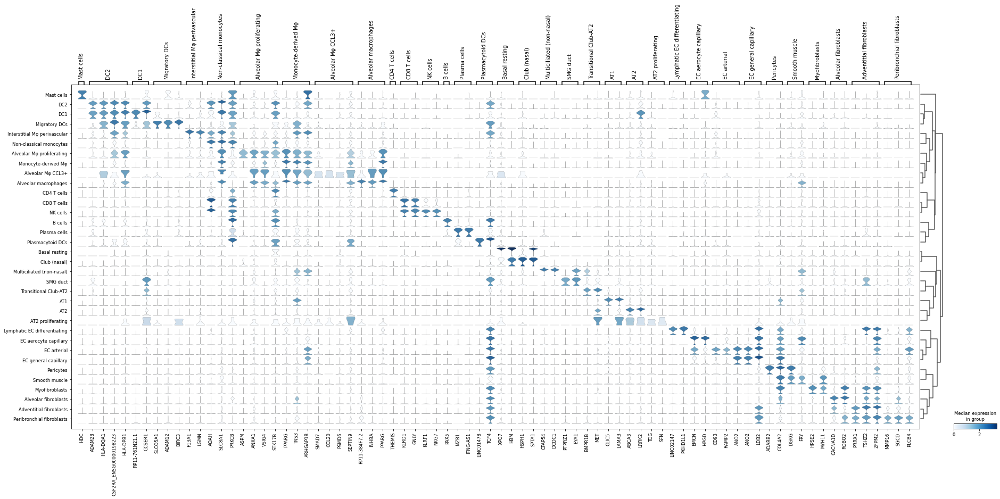

In [36]:
# NSForest_results_selected
## store cluster-marker information in a dictionary
markers = dict(zip(NSForest_results_selected['clusterName'], NSForest_results_selected['NSForest_markers']))
sc.pl.stacked_violin(predictions_adata, var_names=markers, groupby=clusterLabelcolumnHeader, dendrogram=True, use_raw=False)

In [15]:
from NSForest.NSForest_v3dot9_1 import NSForest

clusterLabelcolumnHeader = 'azimuth.finest_level_preds'
NSForest_results_selected = NSForest(
    adata = predictions_adata, 
    cluster_header = clusterLabelcolumnHeader,
    # n_trees = 10,
    n_genes_eval = 10,
    # cluster_list = ["AT2"]
  )

# NSForest_results_selected
## store cluster-marker information in a dictionary
markers = dict(zip(NSForest_results_selected['clusterName'], NSForest_results_selected['NSForest_markers']))
sc.pl.stacked_violin(predictions_adata, var_names=markers, groupby=clusterLabelcolumnHeader, dendrogram=True, use_raw=False)

Preparing data...
--- 2.200690269470215 seconds ---
Calculating medians...


## Assign cell type labels using a custom model
In this section, we show the procedure of generating a custom model and transferring labels from the model to the query data.

Use previously downloaded dataset of 2,000 immune cells as the training set.

In [ ]:
adata_2000 = sc.read('celltypist_demo_folder/demo_2000_cells.h5ad', backup_url = 'https://celltypist.cog.sanger.ac.uk/Notebook_demo_data/demo_2000_cells.h5ad')

Download another scRNA-seq dataset of 400 immune cells as a query.

In [ ]:
adata_400 = sc.read('celltypist_demo_folder/demo_400_cells.h5ad', backup_url = 'https://celltypist.cog.sanger.ac.uk/Notebook_demo_data/demo_400_cells.h5ad')

Derive a custom model by training the data using the [celltypist.train](https://celltypist.readthedocs.io/en/latest/celltypist.html#) function.

In [ ]:
# The `cell_type` in `adata_2000.obs` will be used as cell type labels for training.
new_model = celltypist.train(adata_2000, labels = 'cell_type', n_jobs = 10, feature_selection = True)

Refer to the function [celltypist.train](https://celltypist.readthedocs.io/en/latest/celltypist.html#) for what each parameter means, and to the [usage](https://github.com/Teichlab/celltypist#usage) for details of model training.

This custom model can be manipulated as with other CellTypist built-in models. First, save this model locally.

In [ ]:
# Save the model.
new_model.write('celltypist_demo_folder/model_from_immune2000.pkl')

You can load this model by `models.Model.load`.

In [ ]:
new_model = models.Model.load('celltypist_demo_folder/model_from_immune2000.pkl')

Next, we use this model to predict the query dataset of 400 immune cells.

In [ ]:
# Not run; predict the identity of each input cell with the new model.
#predictions = celltypist.annotate(adata_400, model = new_model, majority_voting = True)
# Alternatively, just specify the model path (recommended as this ensures the model is intact every time it is loaded).
predictions = celltypist.annotate(adata_400, model = 'celltypist_demo_folder/model_from_immune2000.pkl', majority_voting = True)

In [ ]:
adata = predictions.to_adata()

In [ ]:
sc.tl.umap(adata)

In [ ]:
sc.pl.umap(adata, color = ['cell_type', 'predicted_labels', 'majority_voting'], legend_loc = 'on data')

In [ ]:
celltypist.dotplot(predictions, use_as_reference = 'cell_type', use_as_prediction = 'majority_voting')

## Examine expression of cell type-driving genes

Each model can be examined in terms of the driving genes for each cell type. Note these genes are only dependent on the model, say, the training dataset.

In [ ]:
# Any model can be inspected.
# Here we load the previously saved model trained from 2,000 immune cells.
model = models.Model.load(model = 'celltypist_demo_folder/model_from_immune2000.pkl')

In [ ]:
model.cell_types

Extract the top three driving genes of `Mast cells` using the [extract_top_markers](https://celltypist.readthedocs.io/en/latest/celltypist.html#celltypist.models.Model.extract_top_markers) method.

In [ ]:
top_3_genes = model.extract_top_markers("Mast cells", 3)
top_3_genes

In [ ]:
# Check expression of the three genes in the training set.
sc.pl.violin(adata_2000, top_3_genes, groupby = 'cell_type', rotation = 90)

In [ ]:
# Check expression of the three genes in the query set.
# Here we use `majority_voting` from CellTypist as the cell type labels for this dataset.
sc.pl.violin(adata_400, top_3_genes, groupby = 'majority_voting', rotation = 90)